# Task 1

Import Needed Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

1 - Load the data

In [3]:
data = pd.read_csv("first inten project.csv")

2 - Examine data to understand it

In [4]:
print(data.head()) #First 5 rows of the data
print(data.info()) #Data types
print(data.describe()) #Some statisctics of the data

  Booking_ID  number of adults  number of children  number of weekend nights  \
0   INN00001                 1                   1                         2   
1   INN00002                 1                   0                         1   
2   INN00003                 2                   1                         1   
3   INN00004                 1                   0                         0   
4   INN00005                 1                   0                         1   

   number of week nights  type of meal  car parking space    room type  \
0                      5   Meal Plan 1                  0  Room_Type 1   
1                      3  Not Selected                  0  Room_Type 1   
2                      3   Meal Plan 1                  0  Room_Type 1   
3                      2   Meal Plan 1                  0  Room_Type 1   
4                      2  Not Selected                  0  Room_Type 1   

   lead time market segment type  repeated  P-C  P-not-C  average price   

3 - Data Cleaning

In [7]:
data = data.drop_duplicates(subset=["Booking_ID"]) #Remove dublicates


for i in range(len(data["date of reservation"])): #Fix inconsistent values
    try:
        data["date of reservation"][i] = (pd.to_datetime(data["date of reservation"][i]))
    except:
        try:
            data["date of reservation"][i] = (pd.to_datetime(data["date of reservation"][i],format="%Y-%m-%d"))
        except:
            data["date of reservation"][i] = '2018-2-28'
            data["date of reservation"][i] = (pd.to_datetime(data["date of reservation"][i],format="%Y-%m-%d"))

print(data["date of reservation"])

C:\Users\Dell\AppData\Local\Temp\ipykernel_10400\1970627944.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["date of reservation"][i] = (pd.to_datetime(data["date of reservation"][i]))
C:\Users\Dell\AppData\Local\Temp\ipykernel_10400\1970627944.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["date of reservation"][i] = (pd.to_datetime(data["date of reservation"][i]))
C:\Users\Dell\AppData\Local\Temp\ipykernel_10400\1970627944.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

0        2015-10-02 00:00:00
1        2018-11-06 00:00:00
2        2018-02-28 00:00:00
3        2017-05-20 00:00:00
4        2018-04-11 00:00:00
                ...         
36280    2018-09-13 00:00:00
36281    2017-10-15 00:00:00
36282    2018-12-26 00:00:00
36283    2018-07-06 00:00:00
36284    2018-10-18 00:00:00
Name: date of reservation, Length: 36285, dtype: object


C:\Users\Dell\AppData\Local\Temp\ipykernel_10400\1970627944.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["date of reservation"][i] = (pd.to_datetime(data["date of reservation"][i]))
C:\Users\Dell\AppData\Local\Temp\ipykernel_10400\1970627944.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data["date of reservation"][i] = (pd.to_datetime(data["date of reservation"][i]))
C:\Users\Dell\AppData\Local\Temp\ipykernel_10400\1970627944.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stab

4 - Univariate Analysis

Text(0, 0.5, 'Houses')

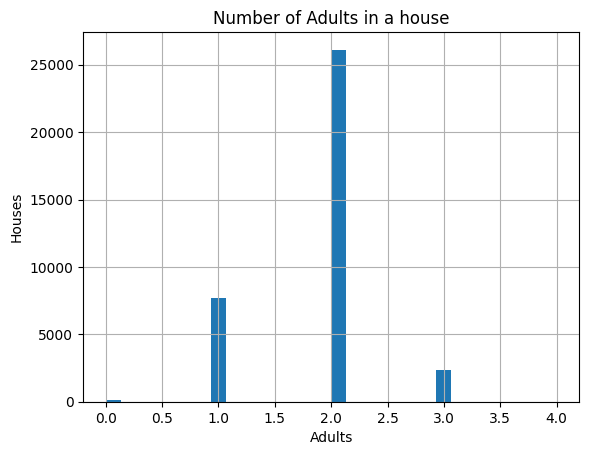

In [6]:
#Plot number of adults as an example
data["number of adults"].hist(bins=30)
plt.title("Number of Adults in a house")
plt.xlabel("Adults")
plt.ylabel("Houses")

Text(0, 0.5, '')

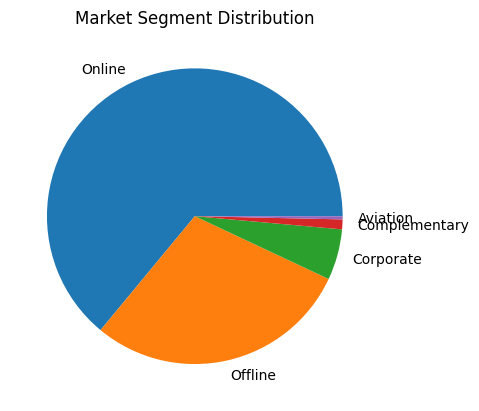

In [7]:
#Plot market segment distribution as an example
data["market segment type"].value_counts().plot(kind="pie")
plt.title("Market Segment Distribution")
plt.xlabel("")
plt.ylabel("")

5 - Bivariate Analysis

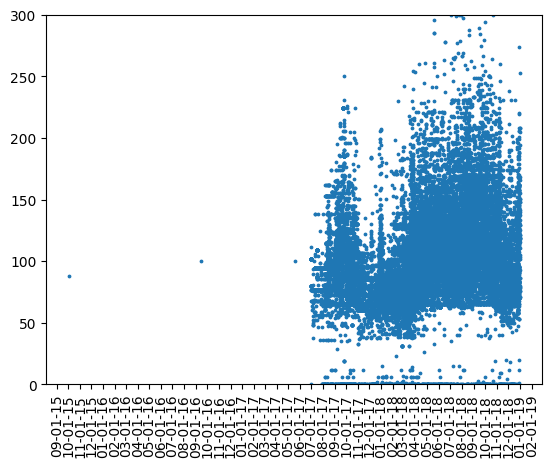

In [ ]:
ax = plt.scatter(data["date of reservation"],data["average price "],s = 3)
plt.ylim([0,300])
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%m-%d-%y'))  # Set date format
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())  # Set locator to day intervals
plt.xticks(rotation=90)
plt.show()

6 - Show outliers

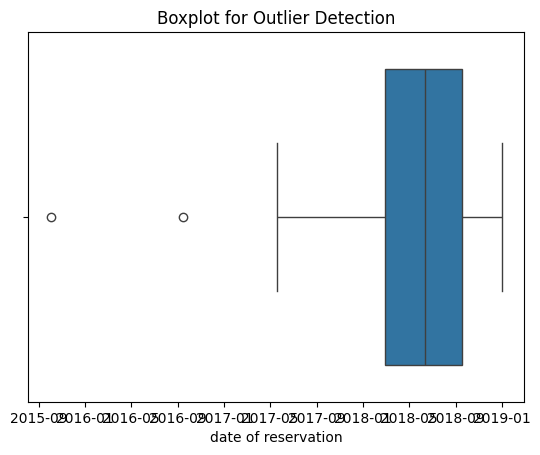

In [9]:
sns.boxplot(x=data["date of reservation"])
plt.title('Boxplot for Outlier Detection')
plt.show()

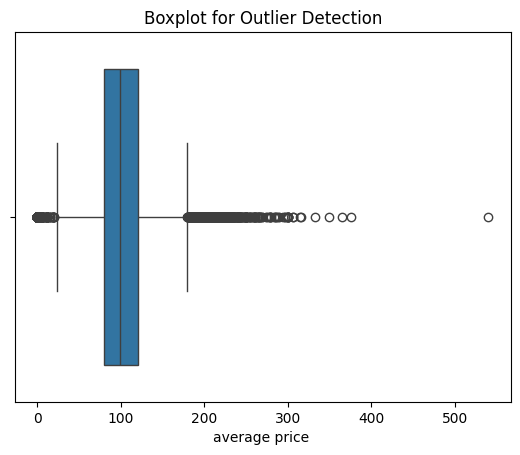

In [33]:
sns.boxplot(x=data["average price "])
plt.title('Boxplot for Outlier Detection')
plt.show()

7 - Multivariate Analysis

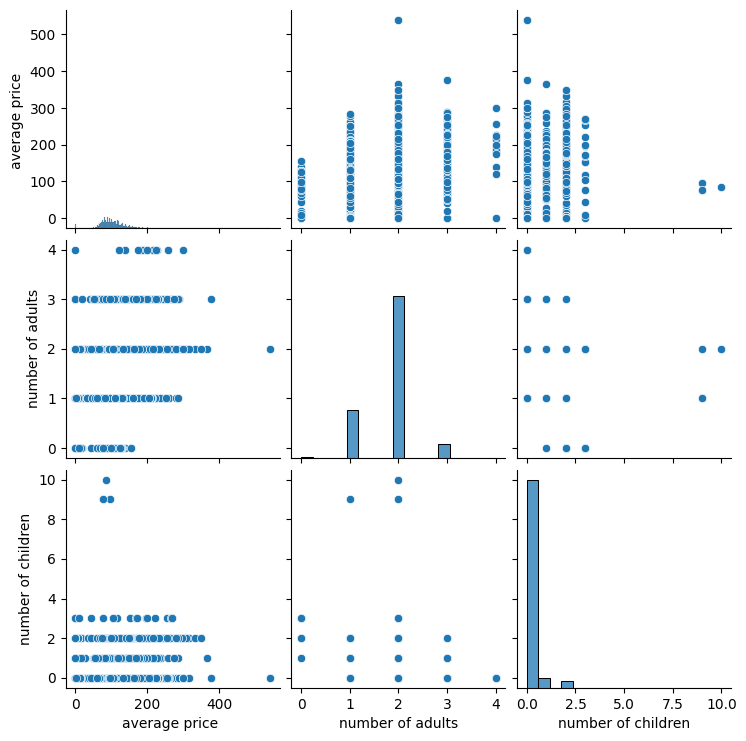

In [35]:
sns.pairplot(data[['average price ', 'number of adults', 'number of children']])
plt.show()


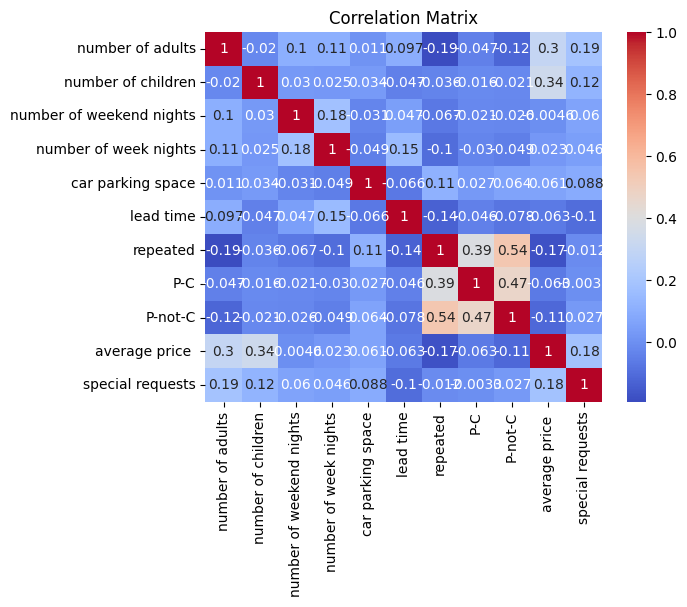

In [48]:
correlation_matrix = data[['number of adults', 'number of children',
       'number of weekend nights', 'number of week nights',
       'car parking space', 'lead time',
       'repeated', 'P-C', 'P-not-C', 'average price ', 'special requests']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()